# Grundlagen

Wir wissen bereits, dass Messwerte die gesuchte Information über eine physikalische Größe beinhalten. Häufig findet die Übertragung dieser Information in Form eines Messsignals statt. Die Frage ist nun: Was ist denn überhaupt ein *Signal*? Dieser Begriff wird umgangssprachlich häufig mehrdeutig benutzt. In unserem Falle, also im technischen Gebrauch, sprechen wir von einem *Zeitverlauf* einer physikalischen Größe. Damit es eindeutig wird, wollen wir statt des Begriffs *Signal* einfach das Wort *Messsignal* einführen. Das bedeutet, dass ein Signal nicht an eine bestimmte physikalische Größe gebunden ist. Ein Signal besteht nämlich in der Regel aus mehreren Parametern (*Informationsparameter*), die die *Träger* von physikalischen Informationen sein können. Das einfachste Beispiel kann ein Messsignal in Form einer sinusförmigen Spannung sein:

$$u(t) = \hat u \cdot \sin(\omega t + \varphi)$$

Diese Sinus-Funktion hängt von drei Parametern ab:
Die **Amplitude** $\hat u$ von beispielsweise einem Spannungssignal hat die Einheit Volt. Sie gibt den maximalen Ausschlag eines Sinussignals an. 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

plt.rcParams['font.size'] = 13; # Schriftgröße

# Initialize the figure and axis
fig, ax = plt.subplots(figsize=(10, 4))
f = 5
# Create a function to update the plot for each frame of the animation
def animate(A):
    ax.clear()  # Clear the previous frame
    
    # Set the signal frequency and time axis

    t = np.linspace(0, 1, 1000)
    
    # Generate the analog signal
    analoges_signal = 0.5*A*np.sin(2 * np.pi * f * t)
    
    
    # Initialisierung des Plots
    ax.plot(t, analoges_signal, label=r'Signal mit Amplitude $\hat u =$%5.1f'%(0.5*A), lw = '2')

    # Set plot labels and legend
    #ax.set_title('Analog zeitdiskret: Abgetastete Sinuswelle')
    ax.set_xlabel('Zeit (s)')
    ax.set_ylabel('Amplitude')
    ax.set_xlim([0, 1])
    ax.set_ylim([-16, 16])
    ax.grid(True)
    ax.legend(loc='upper right')


# Create an animation by varying fs from 1 to 10 with a step of 1
ani = FuncAnimation(fig, animate, frames=range(1, 31), repeat=False)

# Display the animation
plt.tight_layout()
plt.close()
HTML(ani.to_jshtml())

Die **Frequenz** wird mit $f$ bezeichnet und gibt die Anzahl der Schwingungen pro Sekunde an. Die Einheit ist also 1/s = Hz (Hertz). Oft verwendet man auch die **Kreisfrequenz**, welche lediglich das $2\pi$-fache der Frequenz ist, $\omega = 2\pi f$. Auch hier ist die Einheit Hz. Die **Periodendauer** einer Schwingung ist der Kehrwert der Frequenz und berechnet sich zu $T = \frac{1}{f} = \frac{2\pi}{\omega}$ und hat die Einheit s. 

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

plt.rcParams['font.size'] = 13; # Schriftgröße

# Initialize the figure and axis
fig, ax = plt.subplots(figsize=(10, 4))

# Create a function to update the plot for each frame of the animation
def animate(f):
    ax.clear()  # Clear the previous frame
    
    # Set the signal frequency and time axis

    t = np.linspace(0, 1, 1000)
    
    # Generate the analog signal
    analoges_signal = np.sin(2 * np.pi * f * t)
    
    
    # Initialisierung des Plots
    ax.plot(t, analoges_signal, label='Signal mit Frequenz f =%5.1f Hz'%(f), lw = '2')

    # Set plot labels and legend
    #ax.set_title('Analog zeitdiskret: Abgetastete Sinuswelle')
    ax.set_xlabel('Zeit (s)')
    ax.set_ylabel('Amplitude')
    ax.set_xlim([0, 1])
    ax.set_ylim([-1.1, 1.1])
    ax.grid(True)
    ax.legend(loc='upper right')


# Create an animation by varying fs from 1 to 10 with a step of 1
ani = FuncAnimation(fig, animate, frames=range(1, 70), repeat=False)

# Display the animation
plt.tight_layout()
plt.close()
HTML(ani.to_jshtml())

Die **Phase** (oder auch Phasenwinkel) $\varphi$ ist die Phasenverschiebung oder Verzögerung des Messsignals. Die Einheit ist typischerweise Radian (rad) oder °, wobei die Umrechnung $2 \phi = 360^\circ$ gilt. 

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

plt.rcParams['font.size'] = 13; # Schriftgröße

# Initialize the figure and axis
fig, ax = plt.subplots(figsize=(10, 4))
f = 5
n = 126

# Create a function to update the plot for each frame of the animation
def animate(phi):
    ax.clear()  # Clear the previous frame
    
    # Set the signal frequency and time axis
    t = np.linspace(-1, 1, 1000)
    
    # Generate the analog signal
    analog_signal = np.sin(2 * np.pi * f * t + phi)
    referenz_signal = np.sin(2 * np.pi * f * t + 0)

    # Plot the analog signal with the current phase
    ax.plot(t, referenz_signal, label=r'Referenzsignal mit Phase $\varphi$ =%5.1f rad' % 0, lw='3', color = 'tab:blue', alpha = 0.1)
    ax.plot(t, analog_signal, label=r'Signal mit Phase $\varphi$ =%5.1f rad = %5.1f $\pi$' %(phi, phi/np.pi), lw='2', color = 'black')

    # Set plot labels and legend
    ax.set_xlabel('Zeit (s)')
    ax.set_ylabel('Amplitude')
    ax.set_xlim([-1, 1])
    ax.set_ylim([-1.1, 1.1])
    ax.grid(True)
    ax.legend(loc='upper right')


# Create an animation by varying phi from -2*pi to 2*pi with a step of 0.1
phi_values = np.linspace(-2*np.pi, 2*np.pi, 35)
ani = FuncAnimation(fig, animate, frames=phi_values, repeat=False)

# Display the animation
plt.tight_layout()
plt.close()
HTML(ani.to_jshtml())


Je nach Aufgabe können wir das Messsignal auswerten indem wir entweder die Amplitude messen, oder die Frequenz, oder den Phasenwinkel (oder alle zusammen). 

Vorteil der Nutzung von Messsignalen ist, das physikalische Größen mittels dieser Umwandlung relativ einfach übertragen und weiterverarbeitet werden können. Dies ist insbesondere für Steuer- oder Regelungsprozesse von besonderem Interesse. 

## Wandlung von physikalischen Größen

Selbst bei einfachen Messeinrichtungen erfolgt im Allgemeinen eine Umwandlung des aus der Umwelt gewonnenen Messsignals in eine für den Menschen interpretierbare oder zur weiteren Verarbeitung geeignete Signalform. Es ist von entscheidender Bedeutung, dass dabei die Messinformation nicht verfälscht wird. Falls eine Veränderung der Messinformation erforderlich ist, sollte dies stets kontrolliert und bewusst geschehen, um die gewünschte Information weiterhin zugänglich zu machen, wenn nötig.

Folgende Schlussfolgerungen lassen sich aus der Betrachtung der Umwandlung einer physikalischen Größe ziehen:

- In der Regel wird jede physikalische Größe in ein Signal umgewandelt, da nur wenige Größen in der Natur direkt messbar sind.
- Selbst elektrische Spannungen müssen auf eine Weise angezeigt werden können, die für den Menschen verständlich ist. Die Amplitude könnte beispielsweise über einen Zeigerausschlag dargestellt werden. Hierbei kann ein Elektroskop verwendet werden, das über die Spannung oder Spannungsdifferenzen aufgeladen wird. Gleiche Ladungen stoßen sich ab und erzeugen eine elektrostatische Kraft: $F = q\cdot E$, wobei $q$ die Ladung und $E$ die Feldstärke ist. Somit kann das Elektroskop zunächst Ladungen messen. Da es sich jedoch wie ein Kondensator verhält (zwei voneinander isolierte Elektroden), können wir auch Spannungen messen, indem wir $Q = CU$ verwenden, wobei $C$ die Kapazität des Kondensators ist (konstant).
- Für die Temperatur könnte ein temperaturabhängiger Widerstand verwendet werden, der einen Spannungsabfall erzeugt.

Bei der Umwandlung einer Signalform in eine andere sollten die folgenden Grundsätze gelten:

- Die physikalische Größe der Informationsparameter darf nicht verändert werden, sondern lediglich in eine neue Signalform umgewandelt werden.
- Beispiel: Ein Messverstärker, der eine Amplitude eines Messsignals für die Anzeige vorbereitet, wandelt eine Amplitude in eine Amplitude um.

Für die Übertragung von Informationen werden häufig **elektromagnetische Wellen** oder **elektrische Signale** verwendet. In einigen Anwendungsbereichen sind jedoch auch mechanische, pneumatische und hydraulische Signale üblich. Insbesondere in technischen Regelkreisen spielen diese Signale eine wichtige Rolle. Die folgenden Erklärungen können jedoch auf alle Arten von Messsignalen angewendet werden.

![Bild](pictures/messsignal_wandlung.jpg)

## Elektromagnetische Wellen als Informationsträger

::::::{margin}
:::::{grid}
::::{grid-item-card}
:class-header: bg-light
Elektromagnetische Wellen (Spektrum & Eigenschaften) | Physik Tutorial (Studytiger)

<iframe width="200" height="113" src="https://www.youtube.com/embed/N8QdhW_xFLA?si=FQtvJLcoM05Qftf4" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture; web-share" allowfullscreen></iframe>
::::
:::::
::::::

Elektromagnetische Wellen sind Transversalwellen, was bedeutet, dass die Schwingungsrichtung senkrecht zur Ausbreitungsrichtung liegt. Im Gegensatz dazu erfolgt die Schwingung bei Longitudinalwellen in Richtung der Ausbreitung, wie es bei Schallwellen der Fall ist.
Wie der Name bereits impliziert, bestehen elektromagnetische Wellen aus gekoppelten magnetischen und elektrischen Feldern. Diese beiden Felder sind immer senkrecht zueinander angeordnet und stehen jeweils senkrecht zur Ausbreitungsrichtung der Welle.


:::{figure-md} EMwave
<img src="pictures/EMwave.gif" width="750" align="center">

Animation einer elektromagnetischen Welle. Copyright: And1mu, CC BY-SA 4.0 <https://creativecommons.org/licenses/by-sa/4.0>, via [Wikimedia Commons](https://commons.wikimedia.org/wiki/File:EM-Wave.gif) 
:::



Die Ausbreitung von elektromagnetischen Wellen erfolgt mit Lichtgeschwindigkeit 299.792.458 m/s (also ca. 300.000km/s) im Vakuum. 
**Elektromagnetische Strahlung** besteht aus einem **Spektrum** (einer Vielzahl) von elektromagnetischen Wellen unterschiedlicher Frequenz (bzw. Wellenlänge). Das sichtbare Licht nimmt hierbei nur einen ganz kleinen Teil des elektromagnetischen Spektrums ein. 
Ganz links, bei kleinen Wellenlängen in der Größenordnung von weniger als einem Nanometer ($10^{-9}\,\mathrm m$) befinden sich die Röntgenstrahlen. Bei noch kleinere Wellenlängen ist die energiereiche Gammastrahlung zu finden. Bei hohen Wellenlängen im Mikrometerbereich ($10^{-6}\,\mathrm m$) befindet sich die Infrarot (IR) Strahlung, auch Temperaturstrahlung genannt und bei Wellenlängen in der Größenordnung von Centimeter, Meter und Kilometer sind Mikrowellen, Radiowellen und Langwellen für Funk- und Satellitenkommunikation. 


:::{figure-md} EM_spectrum
<img src="pictures/EM_spectrum.jpg" alt="EM_spectrum" class="bg-primary mb-1" width="800px" label = EM_spectrum>

Das elektromagnetische Spektrum.
:::


### Frequenz und Wellenlänge

Frequenz $f$ und Wellenlänge $\lambda$ einer Welle können mittels folgender Formel ineinander umgerechnet werden:

$$ \lambda = \frac{v}{f} = \frac{c}{f} $$

wobei $v$ die Ausbreitungsgeschwindigkeit ist, welche in diesem Falle der Lichtgeschwindigkeit entspricht, $v = c = 299.792.458\,\mathrm{m/s}$ (Wert im Vakuum).

Die Reichweite von elektromagnetischen Wellen zur Übertragung von Informationen hängt von der Wellenlänge bzw. Frequenz der Strahlung ab und den Umgebungsparametern (wie z.B. die Ionosphäre). Elektromagnetische Wellen, welche gerne zur Signalübertragung genutzt werden, sind z.B.:


| Art der Welle          | Frequenz $f$ (Hz)      | Wellenlänge $\lambda$ (Meter)    | Energie $E$ (eV) |
|------------------------|---------------------------|--------------------------------|----------------------------------|
| Funkwellen             | 300 Hz - 300 GHz          | 1 mm - 1 km                    | 1.24 μeV - 1.24 meV             |
| Mikrowellen            | 300 MHz - 300 GHz         | 1 mm - 1 m                     | 1.24 meV - 1.24 μeV             |
| Infrarot-Strahlung     | 300 GHz - 300 THz         | 1 μm - 1 mm                    | 1.24 eV - 1.24 meV              |
| UV-Strahlung           | 300 THz - 790 THz         | 100 nm - 390 nm                | 3.14 eV - 12.4 eV               |
| Röntgenstrahlung       | 300 PHz - 1 EHz           | 0.03 nm - 1 nm                 | 12.4 keV - 413.6 keV            |


In [4]:
f = 300e6 # Frequenz in Hz
c = 299792458 # Lichtgeschwindigkeit in m/s
wellenlaenge = c/f
print('Die Wellenlänge einer Schwingung mit Frequenz f = %5.2f MHz beträgt %5.2f m' %(f/1e6,wellenlaenge))

Die Wellenlänge einer Schwingung mit Frequenz f = 300.00 MHz beträgt  1.00 m


### Energie
Es gilt allgemein, je kleiner die Wellenlänge, desto höher die Frequenz, desto höher ist die Energie, die transportiert wird, welche mittels

$$E = h \cdot f $$

berechnet wird, wobei $h = 6.626\cdot 10^{-34}\,\mathrm{Js}$ das Planck'sche Wirkungsquantum ist.
Die Energiewerte in der Tabelle sind in Elektronenvolt (eV) angegeben. Je nach der spezifischen Frequenz innerhalb des angegebenen Bereichs kann der exakte Energiewert variieren.

### Geschwindigkeit

Die Lichtgeschwindigkeit im Vakuum beträgt $c = 299.792.458\,\mathrm{m/s}$. Meist reicht es aus, diesen Wert zu kennen. Dennoch können unter bestimmten Umständen, insbesondere in Materialien, zu Abweichungen kommen, die die Ausbreitung von elektromagnetischen Wellen vermindern (schneller als $c$ geht nämlich nicht!). Allgemein ist die Ausbreitungsgeschwindigkeit also materialabhängig und berechnet sich durch:

$$c_\mathrm{Medium} = \frac{1}{\mu \epsilon}$$

wobei $\mu$ die Permeabilität und $\epsilon$ die Permittivität sind. 

Generell können sich elektromagnetische Wellen in jedem Medium ausbreiten und benötigen kein *Trägermedium*, wie beispielsweise Schallwellen. 


## Funktionsweise Radiowellen
Für die Langstreckenkommunikation wird elektromagnetische Strahlung mit großer Wellenlänge verwendet. 
Solche langwellige Strahlung wird kaum durch Teilchen in unserer Atmosphäre oder Ionosphäre absorbiert und abgeschwächt, sondern reflektiert. Dadurch eignet sie sich hervorragend für die Signalübertragung von langen Distanzen. Die Ionosphäre agiert quasi als riesengroßer Spiegel für die Radiowelle, wodruch die Strahlung zurück zur Erde reflektiert wird. (Dank kosmischer Strahlung aus dem Weltall werden Elektronen aus Atomen in der Ionosphäre gelöst. Dadruch bilden sich positiv geladene Atomreste, welche zusammen mit den freien Elektronen einen Spiegel für Radiowellen bilden.)

Je nach Distanz für die Kommunikation kommen folgende Wellen zum Einsatz:

* Radiowellen mit Frequenzen **unter 30 MHz** können von der Ionosphäre vollständig reflektiert werden. Einige Telekommunikations- und **Radarsysteme** nutzen die reflektierenden Eigenschaften der Ionosphäre für Radiowellen unterhalb von etwa 30 MHz zur Überbrückung großer Entfernungen.
* Radiowellen mit Frequenzen **oberhalb von 30 MHz** können die Ionosphäre durchdringen, so dass eine Kommunikation mit **Satelliten** möglich ist.  (Die Radiowellen regen die freien Elektronen zum Schwingen an, wodurch ein Dipolstrahler entsteht. Dieser erzeugt Strahlung mit einer Phasenverschiebung, aber der gleichen Frequenz. Als Resultat sieht es so aus, als würde die einfallende Strahlung von der Erde vom Lot weggebrochen werden (Die Ionosphäre ist also ein optisch dünneres Medium. Je steiler der Einfallswinkel (oder je höher die Frequenz), umso tiefer dringt die Radiowelle in die ionisierte Schicht ein). 
* Um diesen Brechungsindex-Einfluss zu minimieren ist es ratsam zu noch langwelligerer Strahlung zu wechseln, welche im **GHz-Bereich** liegt. Doch auch hier sind Messfehler aufgrund von Dichteschwankungen bei der Satellitennavigation immer noch störend.


::::::{margin}
:::::{grid}
::::{grid-item-card}
:class-header: bg-light
Das Verhalten von Funkwellen in der Ionosphäre (Ein sehr alter Lehrfilm der Bundeswehr). 

<iframe width="200" height="113" src="https://www.youtube.com/embed/_MWo_1Epmkk?si=gK3W1sk5MZ8B3Mpb" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture; web-share" allowfullscreen></iframe>
::::
:::::
::::::

```{admonition} Funkwellen in der Ionosphäre
:class: dropdown

Radiowellen unterschiedlicher Frequenz und Einfallswinkel werden an der Ionosphäre reflektiert und auf die Erde zurückgeworfen oder durchgelassen, wodurch Satellitenkommunikation ermöglicht wird. Ob und wie Funkwellen reflektiert werden, hängt von der Dichte und Höhe der Ionosphärenschicht ab sowie von der Frequenz der einfallenden Funkwelle.

Durch Sonneneinstrahlung im ultravioletten Bereich werden Elektronen in der Ionosphäre von ihren Luftatomen getrennt. Dadurch entstehen freie Elektronen, während positiv geladene Ionenrümpfe zurückbleiben. Je stärker die Sonneneinstrahlung ist (je mehr UV-Lichtteilchen vorhanden sind), desto mehr Elektronen werden freigesetzt, und die Elektronendichte, $N_e$, steigt an.

- 0-90 km Höhe: Hier gibt es keine freien Elektronen, keine Ionosphäre!
- 50-90 km Höhe: D-Schicht: Keine Bedeutung für unsere Funkwellen (sie existiert nur tagsüber, wenn die Sonneneinstrahlung am stärksten ist).
- ~100 km Höhe: E-Schicht
- ~200 km Höhe: F1-Schicht
- 250-400 km Höhe: F2-Schicht: Größte Elektronen-/Ionendichte mit etwa $N_e =$ 1 Million/cm$^3$ freier Elektronen.
- Noch höher: Luftmoleküle werden seltener, wodurch die Elektronendichte trotz stärkerer Strahlung wieder abnimmt.

Die Ionosphäre ist tagsüber bei maximaler Sonneneinstrahlung am stärksten mit freien Elektronen angereichert. Nachts nimmt die Ionosphäre ab, da sich die freien Elektronen wieder mit den Ionen verbinden. Dies dauert je nach Höhe der Schicht unterschiedlich lange. Die F2-Schicht beispielsweise ist auch nachts noch so stark ausgeprägt, dass sie zur Übertragung von Funkwellen genutzt werden kann.

Wenn Funkwellen in die Ionosphäre eintreten, ändern sie ihre Richtung, ähnlich wie Lichtstrahlen an einem Prisma. Niedrigere Frequenzen brechen sich leichter als hohe Frequenzen. Schräge Wellen brechen sich leichter als senkrecht eintreffende Strahlen.

Das Verhalten von Funkwellen beim Auftreffen auf freie Elektronen kann mittels Plasmatheorie beschrieben werden. In einem Plasma treten lokal verdichtete Bereiche von freien Elektronen auf, das sogenannte Elektronengas. An diesen Stellen ist die Dichte der Elektronen so hoch, dass die Coulombkraft abstoßend zwischen den Elektronen wirkt, wodurch die Elektronen auseinandergetrieben werden. Aufgrund der Trägheit der Elektronen treten jedoch an anderen Stellen wieder lokale Verdichtungen auf, und der Effekt wiederholt sich. Dieses Hin und Her von lokalen Ladungsüberschüssen führt zu einer periodischen Schwingung, der sogenannten Plasmafrequenz, mit der die Elektronendichte um ihre mittlere Dichte oszilliert:

$$f_p = \frac{1}{2\pi}\sqrt{\frac{N_e e^2}{\epsilon_e m_e}} \approx 8,978\,\mathrm{Hz} \cdot \sqrt{\frac{N_e}{\mathrm{m^3}}}$$

Hierbei ist $\epsilon_0 = 8{,}854\cdot 10^{-12}\,\mathrm{\frac{As}{Vm}}$ die elektrische Feldkonstante, $N_e$ die Elektronendichte, $m_e$ die Elektronenmasse, $e = 1,602\cdot 10^{-19}\,\mathrm{C}$ die Elementarladung. Abhängig von der Höhe haben wir in der Ionosphäre unterschiedliche Elektronendichten und können folgende Plasmafrequenzen berechnen:

- 100 km Höhe: $f_p = 1{,}5\,\mathrm{MHz}$
- 800 km Höhe: $f_p = 7\,\mathrm{MHz}$

Der Brechungsindex $n$ der Ionosphäre lässt sich mittels folgender Formel berechnen:

$$n = \sqrt{1- \frac{f_p^2}{f^2}}$$

Hierbei wurde die Zyklotronfrequenz der Elektronen, die durch das Magnetfeld der Erde hervorgerufen wird, vernachlässigt. Unter Berücksichtigung der Kreisbewegung der Elektronen um die Feldlinien im Erdmagnetfeld würde ansonsten ein zusätzlicher Frequenzterm von etwa 1,3 MHz zur Gleichung hinzugefügt werden, und je nach Polarisation der einfallenden Funkwelle (links-zirkular oder rechts-zirkular) würden sich leicht unterschiedliche Brechungsindizes ergeben, abhängig davon, ob die Drehrichtung mit der Elektronenbewegung übereinstimmt.

Anhand dieser Formel sind zwei Fälle zu berücksichtigen:

- $f < f_p$: Der Brechungsindex wird imaginär. Das bedeutet, es findet vollständige Reflexion statt, und Lang- und Mittelwellen kommen wieder zur Erde zurück.
- $f > f_p$: Der Brechungsindex ist real. Das bedeutet, die Funkwellen können die Schicht durchdringen, wenn der Einfallswinkel senkrecht ist.

Das bedeutet für unsere beiden oben genannten Fälle:

- In 100 km Höhe werden Funkwellen mit einer Frequenz von <1,5 MHz vollständig reflektiert. Wellen höherer Frequenz können diese Ionosphärenschicht durchdringen.
- In 800 km Höhe werden Funkwellen mit einer Frequenz von <7,0 MHz vollständig reflektiert. Wellen höherer Frequenz können diese Ionosphärenschicht durchdringen.
- Funkwellen mit Frequenzen >7 MHz werden die Erde nicht erreichen.

Die Plasmafrequenz ist in dieser Annäherung also die kritische Frequenz, bis zu welcher Funkwellen unter senkrechtem Einfallswinkel vollständig reflektiert werden.

Darüber hinaus wird beobachtet, dass die Durchlässigkeit der Ionosphäre für Funkwellen vom Einfallswinkel abhängt und näherungsweise über fol
```

## Klassifizierung von Messsignalen <a id="SubSec-Klassifizierung_von_Messsignalen"></a>

::::::{margin}
:::::{grid}
::::{grid-item-card}
:class-header: bg-light
Klassifikation von Signalen analog kontinuierlich diskrekt diskontinuierlich (Elektrotechnik in 5 Minuten by Alexander Stöger)

<iframe width="200" height="113" src="https://www.youtube.com/embed/mjKiolpkjjI?si=VjB7Y554zQ6sJjmj" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture; web-share" allowfullscreen></iframe>
::::
:::::
::::::

Für eine ausreichende Charakterisierung von Messsignalen werden diese nach dem Wertevorrat der Informationsparameter (analog oder diskret) und dem zeitlichen Auftreten (kontinuierlich oder diskontinuierlich/diskret) unterschieden. Oft kommt dazu noch eine weitere Signalart, nämlich *stochastische* Signale, auch bekannt als *Rauschen*, bei welchem die Werte zufallsbehaftet sind. In diesem Fall können erst bei einer großen Anzahl von Ereignissen gesicherte Aussagen über die Qualität einer Messung geliefert werden (damit haben wir uns ja schon innerhalb der Messunsicherheiten und der Statistik befasst). 
Determinierte Signale liefern hingegen zu jedem Zeitpunkt einen festen Zusammenhang zwischen zu analysierenden und den erhaltenen Messwerten. Allgemein finden wir in technischen Messsystemen eigentlich immer deterministische Signale. Das heißt es gilt Determiniertheit.

Folgende Klassifizierungen von Messsignalen existieren:
* **analog**: Der Wertebereich (also die Werte auf der y-Achse) ist kontinuierlich. Theoretisch kann der Informationsparameter $y$ jeden beliebigen Wert innerhalb seines Wertebereichs annehmen. Dadurch erhält man eine proportionale Abbildung zwischen Messsignal und Parameter. Allerdings ist dieses System sehr störanfällig und reagiert auf Störsignale, Rauschen oder Temperaturdrifts. 
* **diskret (wertdiskret)**: Als diskret kann man sowohl der Werte- als auch den Zeitbereich bezeichnen. Für die Eindeutigkeit können wir den Begriff wertdiskret benutzen. Hierbei kann der Informationsparameter nur endlich viele Werte annehmen und wird nicht mehr vollständig proportional abgebildet. Dadurch ist das System zwar etwas weniger empfindlich gegenüber Störeinflüssen (erst nach Überschreiten von Grenzwerten wird der nächste *diskrete* Messwert angezeigt), doch bei der Abbildung analoger Messwerte auf einen diskreten Informationsparameter gehen Informationen verloren. 
* **kontinuierlich**: Dies ist das Analogon auf der Zeitachse zum *analogen* Wertebereich. Kontinuierliche Messwerte bedeutet, dass die Informationparameter zu jedem beliebigen *Zeitpunkt* seinen Wert ändern kann. D.h. der zeitliche Verlauf ist immer verfolgbar, jedoch können auch hier Störungen einwirken, und zwar jederzeit, die die Messung beeinflussen. Außerdem wird die Datenmenge oft unnötig groß.
* **diskontinuierlich (zeitdiskret)**: Nun befassen wir uns mit diskreten Messwerten im Zeitbereich. Dies nennt zur Unterscheidung auch diskontinuierlich. Hierbei stehen Informationsparameter nur zu bestimmten Zeitpunkten zur Verfügung, wodurch Störungen, die zwischen zwei Zeitpunkten wirken, keine Rolle mehr spielen. Nachteil ist jedoch, dass die Informationen nur noch zu bestimmten Zeitpunkten zur Verfügung stehen.
* **stochastisch**: Jetzt steckt der Informationsparameter in einer stochastischen Größe, also im Rauschen. Da Störungen häufig eine charakteristische Verteilung haben, sind diese, wenn überhaupt, nur stark reduziert bemerkbar. Sie werden quasi über die Messzeit hinweg mitgemessen, integrieren sich auf, und können weggemittelt werden (Mittelwert ist häufig bei Null). Nachteil dieses Verfahrens ist, dass die Information erst nach mehrmaligen Messungen zur Verfügung steht, was einen großen Zeitbereich benötigen kann.
* **determiniert**: Im Unterschied zu stochastischen Signalen kann hier die Information mit nur einer einmaligen Messung gewonnen werden. Nachteil ist, dass diese einmalige Messung durch Störungen unbrauchbar gemacht werden können. 

::::::{margin}
:::::{grid}
::::{grid-item-card}
:class-header: bg-light
Was ist der Unterschied zwischen analogen und digitalen Daten? (Digi4All)

<iframe width="200" height="113" src="https://www.youtube.com/embed/IZUcqFCsKnA?si=6him2gazJymEJCJQ" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture; web-share" allowfullscreen></iframe>
::::
:::::
::::::


Bei *digitalen* Signalen sind die diskreten Werte einem bestimmten Alphabet zugeordnet. Im *binären* System kann der Informationsparameter dann nur noch zwei Werte annehmen. 

```{admonition} Beispiel
:class: tip
Ein **Quecksilberthermometer** ist ein **analoges** Messgerät. Das Quecksilber kann im Thermometer jede beliebige Höhe annehmen und die Temperatur wird so kontinuierlich dargestellt. 
Häufig werden heutzutage **digitale Thermometer** oder Wetterstationen benutzt. Hier wird die Temperatur mithile eines Sensors in eine elektrische Spannung umgeformt. Die dabei gemessene Spannung ist immer noch analog, wird aber, damit es ein brauchbares Signal ist, abgetastet. Diesen Prozess nennt man auch **Sampling** und führt zu einer **digitalen Darstellung** der Temperatur zu diskreten Zeitpunkten mit Lücken dazwischen. 
```

Das folgende Bild zeigt, wie der Wertevorrat und deren zeitliche Verfügbarkeit aussehen könnte. Hierbei können kontinuierliche und diskrete sowohl im Wertebereich, also auch im Zeitbereich, kombiniert werden.
Beispiele zum Bild im folgenden Diagramm sind:
* **analog kontinuierlich**: Manometer am Druckkessel, Aufgesetzte Messuhr (Wärmeausdehnung), Analoge Spannungs- oder Strommessung. 
* **analog zeitdiskret**: Abgetastetes System. Informationen gehen verloren.
* **wertdiskret und kontinuierlich**: Lagerbestand (Es können nur ganze Bauelemente dem Lager entnommen werden, sodass der Lagerbestand wertediskret ist. Es ist aber zu jedem Zeitpunkt bekannt, wie viele Bauelemente eines bestimmten Typs vorhanden sind. Das Signal ist zeitkontinuierlich.)
* **wertdiskret und zeitdiskret**: Digitalisierung

```{admonition} Aufgabe Live-Code
:class: tip
Starte den Live-Code und änder mal `quantisierungs_bits = 2` in folgender Code-Zelle und beobachte wie sich die wertdiskrete Aufteilung bei der Digitalisierung verhält. 
`
```

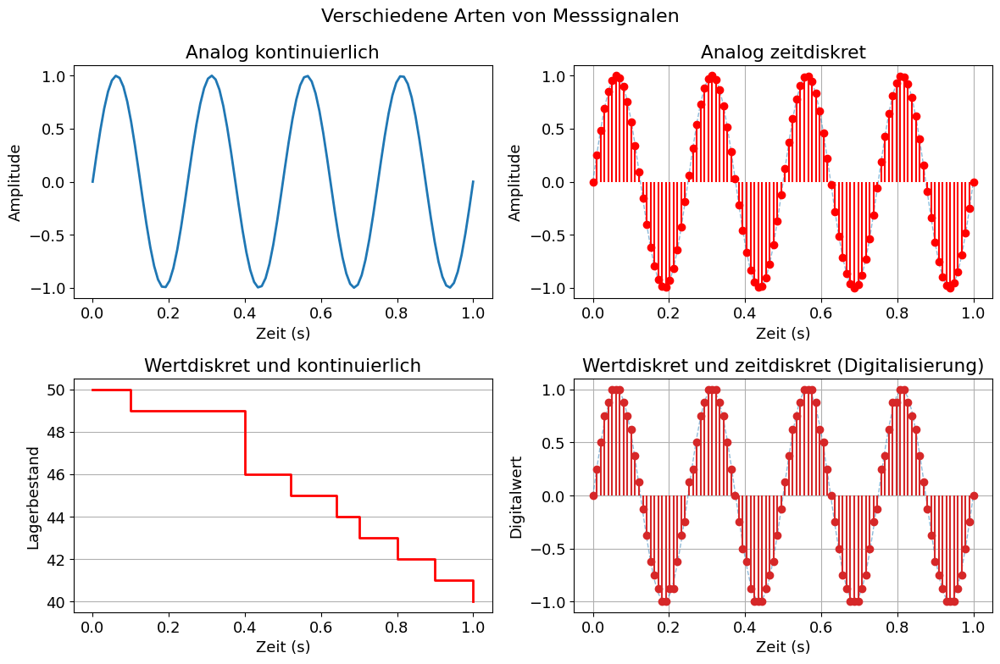

In [5]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.size'] = 13; # Schriftgröße

# Erstellen der Zeitachse
t = np.linspace(0, 1, 100)  # Zeit von 0 bis 1 Sekunde

# Simuliere ein kontinuierliches analoges Signal
analoges_signal = np.sin(2 * np.pi * 4 * t)  # Kontinuierliche Sinuswelle

# Simuliere ein wertdiskretes aber kontinuierliches Signal
t_lager = np.array([0,0.1, 0.15, 0.4, 0.44, 0.46, 0.52, 0.56, 0.59, 0.64, 0.7, 0.77, 0.8, 0.87, 0.9, 1.0])  # Zeit von 0 bis 10 Sekunden
lagerbestand = 50 - np.floor(10*t_lager)  # Der Lagerbestand sinkt um 1 alle Sekunde

# Digitalisierung des analogen Signals
quantisierungs_bits = 4  # Anzahl der Quantisierungsbits
digitalisiertes_signal = np.round(analoges_signal * (2**(quantisierungs_bits-1)))
max_amplitude = 2**(quantisierungs_bits-1)  # Maximaler Amplitudenwert
digitalisiertes_signal = digitalisiertes_signal / max_amplitude

# Erstellen des Subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 8))

# Plot 1: Analog kontinuierlich
axs[0, 0].plot(t, analoges_signal, color = 'tab:blue', lw = '2')
axs[0, 0].set_title('Analog kontinuierlich')
axs[0, 0].set_xlabel('Zeit (s)')
axs[0, 0].set_ylabel('Amplitude')

# Plot 2: Analog zeitdiskret
axs[0, 1].plot(t, analoges_signal, color = 'tab:blue', lw = '1', alpha = 0.5, ls = '--')
axs[0, 1].stem(t, analoges_signal, 'tab:red', markerfmt='ro', basefmt=" ", linefmt='r-')
axs[0, 1].set_title('Analog zeitdiskret')
axs[0, 1].set_xlabel('Zeit (s)')
axs[0, 1].set_ylabel('Amplitude')
axs[0, 1].grid(axis = 'x')


# Plot 3: Wertdiskret und kontinuierlich
axs[1, 0].step(t_lager, lagerbestand, where = 'post', color = 'red', lw = '2')
axs[1, 0].set_title('Wertdiskret und kontinuierlich')
axs[1, 0].set_xlabel('Zeit (s)')
axs[1, 0].set_ylabel('Lagerbestand')
axs[1, 0].grid(axis = 'y')


# Plot 4: Wertdiskret und zeitdiskret (Digitalisierung)
axs[1, 1].plot(t, analoges_signal, color = 'tab:blue', lw = '1', alpha = 0.5, ls = '--')
axs[1, 1].stem(t, digitalisiertes_signal, 'tab:red', markerfmt='o', basefmt=" ", linefmt='tab:red')
axs[1, 1].set_title('Wertdiskret und zeitdiskret (Digitalisierung)')
axs[1, 1].set_xlabel('Zeit (s)')
axs[1, 1].set_ylabel('Digitalwert')
axs[1, 1].grid(axis = 'both')

# Platz für den Plot-Titel zwischen den Subplots
plt.suptitle('Verschiedene Arten von Messsignalen', fontsize=16)

# Automatische Anpassung der Layouts
plt.tight_layout()

# Anzeigen des Subplots
plt.show()